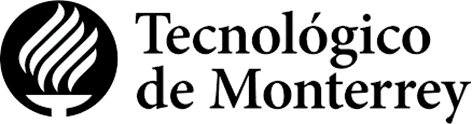 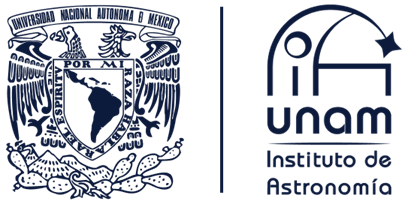


# **Proyecto Integrador**  
## Detección de Galaxias Enanas con métodos de ML  

---

### **Profesores Titulares**  
- Dra. Grettel Barceló Alonso  
- Dr. Luis Eduardo Falcón Morales  

### **Profesor Tutor**  
- Dra. Ludivina Facundo  

### **Patrocinador**  
- Dr. Octavio Valenzuela Tijerino  
  Investigador titular del IA-UNAM  

---

### **Integrantes Equipo 21**  
- Eduardo Rodríguez Ramírez  
  - A01794892@tec.mx  
- Víctor Hugo Avila Felipe  
  - A01794425@tec.mx  

---



## **Introducción**

El presente proyecto se enfoca en la clasificación de galaxias en **enanas** y **no enanas** utilizando imágenes obtenidas del **proyecto MaNGA (Mapping Nearby Galaxies at Apache Point Observatory)**, que forma parte del **Sloan Digital Sky Survey (SDSS-IV)**.  

MaNGA es un levantamiento astronómico que emplea **espectroscopia de campo integral (IFS)** para mapear la estructura interna de miles de galaxias cercanas. A diferencia de los estudios tradicionales de imágenes, MaNGA no solo captura la apariencia visual de las galaxias, sino que también permite analizar su composición química, cinemática y procesos de formación estelar. Las imágenes utilizadas en este estudio provienen de las observaciones realizadas por MaNGA, donde cada galaxia observada es representada en un formato que resalta sus características estructurales y espectroscópicas.

Las **galaxias enanas** son sistemas estelares de **baja masa y pequeño tamaño**, generalmente con menos de **mil millones de estrellas**, en comparación con galaxias masivas como la Vía Láctea, que contiene cientos de miles de millones de estrellas. Son los tipos de galaxias más abundantes en el universo y juegan un papel fundamental en la formación y evolución de estructuras galácticas a gran escala.  

Las galaxias enanas pueden encontrarse de forma aislada o como satélites orbitando galaxias más grandes, y muchas de ellas han sido identificadas en el **Grupo Local**, donde se encuentran la Vía Láctea y Andrómeda. Su estudio es clave para comprender los procesos de acreción y fusión galáctica, así como la influencia de la materia oscura en la evolución del universo.

## **Objetivo del Proyecto**
El propósito principal de este trabajo es desarrollar un modelo de clasificación de galaxias en **enanas** y **no enanas** a partir de imágenes. Dado que el conjunto de datos está altamente desbalanceado, con una gran mayoría de galaxias no enanas y un número muy reducido de galaxias enanas, se implementan diversas técnicas para mejorar la precisión del modelo, incluyendo **data augmentation**, balanceo de clases mediante ajuste de pesos en la función de pérdida y exploración de distintos umbrales de clasificación.

Este análisis tiene aplicaciones en el estudio de la evolución galáctica, ya que las galaxias enanas juegan un papel clave en la formación y desarrollo de estructuras a gran escala en el universo. La correcta identificación y clasificación de estos objetos puede contribuir al entendimiento de su papel en la evolución cósmica y su interacción con galaxias más masivas.

## Feature Engineering

El catálogo de galaxias enanas forma parte del catalogo MaNGA por lo que es necesario unirlos para obtener los nombres de las imagenes y poder alimentarlas al modelo

In [3]:
import pandas as pd

# Cargar dataset
# Configuración de rutas
IMAGE_DIR = "..\\nair_manga\imagenes\original"  # Carpeta con las imágenes

META_DWARFS_PATH = "..\\nair_manga\\list_dwarfs.csv"  # Ruta al archivo CSV
META_MANGA_PATH = "..\\nair_manga\\Nair_ManGA.csv"

df_dwarfs = pd.read_csv(META_DWARFS_PATH)
df_manga = pd.read_csv(META_MANGA_PATH)

print(len(df_dwarfs))
df_dwarfs.head()

10126


,name,redshift,Type,Type Group,dwarf
0,manga-10001-12701,0.039207,NaN,NaN,0.0
1,manga-10001-12702,0.040811,NaN,NaN,0.0
2,manga-10001-12703,0.046209,NaN,NaN,0.0
3,manga-10001-12704,0.014122,NaN,NaN,0.0
4,manga-10001-12705,0.046235,NaN,NaN,0.0


In [4]:
df_manga

,JID,RAdeg,DEdeg,Type,TType,Rp,Rp90,sample,name2,name,img_name
0,J124159.18+442355.64,190.49700,44.399000,NaN,1,4.970000,6.209000,Nair,J124159.18+442355.64.jpg,J124159.18+442355.64,J124159.18+442355.64.jpg
1,J130833.74+434547.57,197.14100,43.764000,NaN,3,5.783000,7.209000,Nair,J130833.74+434547.57.jpg,J130833.74+434547.57,J130833.74+434547.57.jpg
2,J130837.91+434415.08,197.15800,43.738000,NaN,-3,16.393000,17.335000,Nair,J130837.91+434415.08.jpg,J130837.91+434415.08,J130837.91+434415.08.jpg
3,J131111.33+434334.77,197.79800,43.727000,NaN,5,12.274000,12.200000,Nair,J131111.33+434334.77.jpg,J131111.33+434334.77,J131111.33+434334.77.jpg
4,J131227.14+434717.86,198.11400,43.789000,NaN,-5,11.697000,15.316000,Nair,J131227.14+434717.86.jpg,J131227.14+434717.86,J131227.14+434717.86.jpg
...,...,...,...,...,...,...,...,...,...,...,...
21268,J235546.58+155111.2,358.94766,15.850594,E,-5,15.077740,17.901798,JAVM_HHT,J235546.58+155111.2.jpg,manga-8075-12702,J235546.58+155111.2.jpg
21269,J235642.29+134633.0,359.17523,13.776346,Sc,5,16.149550,17.496666,JAVM_HHT,J235642.29+134633.0.jpg,manga-8075-12701,J235642.29+134633.0.jpg
21270,J235853.85+140422.0,359.72440,14.072816,Sb,3,32.570410,29.618713,JAVM_HHT,J235853.85+140422.0.jpg,manga-8075-3702,J235853.85+140422.0.jpg
21271,J235900.55+140008.2,359.75230,14.002280,Sa,1,8.214783,10.527441,JAVM_HHT,J235900.55+140008.2.jpg,manga-8075-3701,J235900.55+140008.2.jpg


In [5]:
data=pd.merge(df_dwarfs, df_manga, how='left', left_on='name', right_on='name')

print(len(data))

data.head()

10126


,name,redshift,Type_x,Type Group,dwarf,JID,RAdeg,DEdeg,Type_y,TType,Rp,Rp90,sample,name2,img_name
0,manga-10001-12701,0.039207,NaN,NaN,0.0,J085329.03+573554.9,133.37110,57.598427,Sbc,4.0,7.655921,7.880948,JAVM_HHT,J085329.03+573554.9.jpg,J085329.03+573554.9.jpg
1,manga-10001-12702,0.040811,NaN,NaN,0.0,J085444.56+572848.8,133.68567,57.480250,SABbc,4.0,13.209347,14.147447,JAVM_HHT,J085444.56+572848.8.jpg,J085444.56+572848.8.jpg
2,manga-10001-12703,0.046209,NaN,NaN,0.0,J090404.13+570532.3,136.01717,57.092330,SABbc,4.0,10.923637,13.001850,JAVM_HHT,J090404.13+570532.3.jpg,J090404.13+570532.3.jpg
3,manga-10001-12704,0.014122,NaN,NaN,0.0,J085557.56+574040.6,133.98996,57.677967,Sd,7.0,26.147806,28.682878,JAVM_HHT,J085557.56+574040.6.jpg,J085557.56+574040.6.jpg
4,manga-10001-12705,0.046235,NaN,NaN,0.0,J090700.33+572705.1,136.75137,57.451435,Sbc,4.0,9.726173,11.039550,JAVM_HHT,J090700.33+572705.1.jpg,J090700.33+572705.1.jpg


In [6]:
# Resumen estadístico del dataset
summary_statistics = data.describe().transpose()
summary_statistics

,count,mean,std,min,25%,50%,75%,max
redshift,10125.0,-26.618146,515.685057,-9999.000000,0.025918,0.037540,0.055555,0.149719
Type Group,135.0,3.548148,1.144217,1.000000,3.000000,4.000000,4.000000,5.000000
dwarf,10126.0,0.015702,0.124327,0.000000,0.000000,0.000000,0.000000,1.000000
RAdeg,10020.0,183.209744,76.317000,0.008808,128.992560,194.092185,239.743190,359.836180
DEdeg,10020.0,28.650382,17.963708,-9.302426,14.660079,29.426575,43.878192,65.289734
TType,10020.0,1.088922,3.778102,-5.000000,-2.000000,2.000000,4.000000,10.000000
Rp,10020.0,12.901348,10.527061,1.020723,7.458277,10.818974,15.312954,185.484420
Rp90,10020.0,15.381946,10.488182,0.223419,9.324070,12.937842,18.421434,148.008440


In [7]:
data[['dwarf']].value_counts()

dwarf
0.0      9967
1.0       159
Name: count, dtype: int64

## Análisis de Valores Faltantes
Se realizó un análisis para identificar la cantidad de valores faltantes en cada columna del dataset y su proporción relativa. Los resultados son los siguientes:

In [8]:
# Identificar valores faltantes
missing_values = data.isnull().sum()
missing_percent = (missing_values / len(data)) * 100
missing_summary = pd.DataFrame({'Valores Faltantes': missing_values, 'Porcentaje de Faltantes (%)': missing_percent})
missing_summary

,Valores Faltantes,Porcentaje de Faltantes (%)
name,0,0.000000
redshift,1,0.009876
Type_x,9991,98.666798
Type Group,9991,98.666798
dwarf,0,0.000000
JID,106,1.046810
RAdeg,106,1.046810
DEdeg,106,1.046810
Type_y,106,1.046810
TType,106,1.046810


In [9]:
data.dropna(subset=['img_name'], inplace=True)

missing_values = data.isnull().sum()
missing_percent = (missing_values / len(data)) * 100
missing_summary = pd.DataFrame({'Valores Faltantes': missing_values, 'Porcentaje de Faltantes (%)': missing_percent})
missing_summary

,Valores Faltantes,Porcentaje de Faltantes (%)
name,0,0.000000
redshift,0,0.000000
Type_x,9886,98.662675
Type Group,9886,98.662675
dwarf,0,0.000000
JID,0,0.000000
RAdeg,0,0.000000
DEdeg,0,0.000000
Type_y,0,0.000000
TType,0,0.000000


In [10]:
data[['dwarf']].value_counts()

dwarf
0.0      9863
1.0       157
Name: count, dtype: int64

Se observa un gran desbalace entre clases

## Visualizaciones de Variables Numéricas
Se incluyen a continuación las visualizaciones que resumen las distribuciones, valores atípicos y correlaciones entre las variables numéricas.

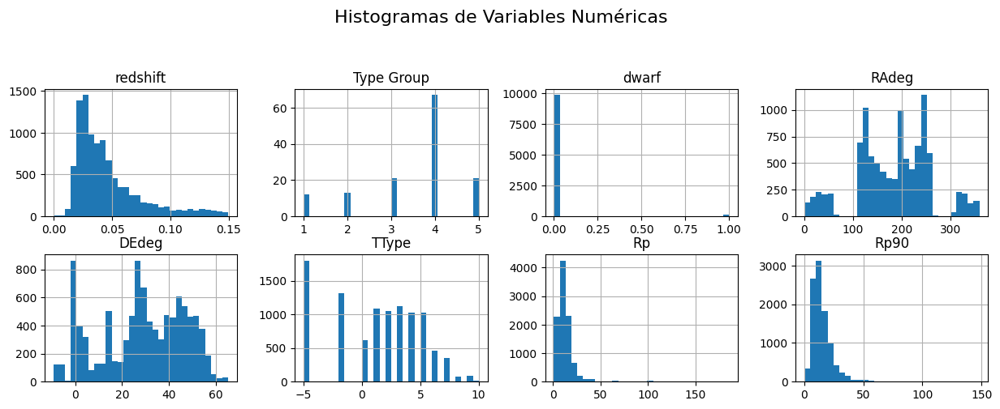

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualizar histogramas
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns
data[numeric_columns].hist(bins=30, figsize=(15, 10), layout=(4, 4))
plt.suptitle('Histogramas de Variables Numéricas', fontsize=16)
plt.show()

# EDA Imagenes

In [12]:
import os
from PIL import Image

# Inspeccionar las propiedades básicas
image_properties = []
for img_name in os.listdir(IMAGE_DIR):
    img_path = os.path.join(IMAGE_DIR, img_name)
    with Image.open(img_path) as img:
        image_properties.append({
            'name': img_name,
            'format': img.format,
            'mode': img.mode,
            'size': img.size,  # (width, height)
        })

# Crear DataFrame con las propiedades
import pandas as pd
image_df = pd.DataFrame(image_properties)
print(image_df.head())

# Resumen de formatos y dimensiones
print(image_df['format'].value_counts())
print(image_df['size'].value_counts())


                       name format mode        size
0   J000002.09+155254.1.jpg   JPEG  RGB  (800, 800)
1  J000007.81-000226.09.jpg   JPEG  RGB  (800, 800)
2  J000012.78+010712.72.jpg   JPEG  RGB  (800, 800)
3   J000022.84+160852.4.jpg   JPEG  RGB  (800, 800)
4   J000036.55+154557.6.jpg   JPEG  RGB  (800, 800)
format
JPEG    21273
Name: count, dtype: int64
size
(800, 800)    21273
Name: count, dtype: int64


Ejemplos de galaxias enanas

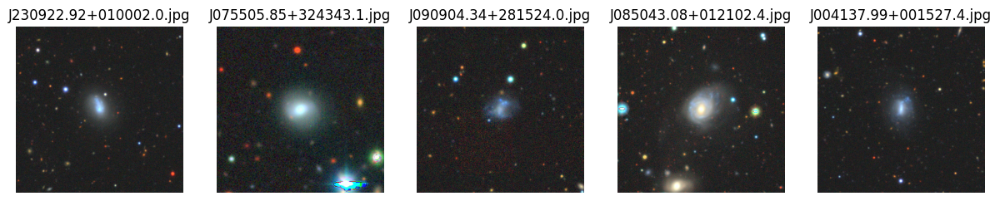

In [13]:
import matplotlib.pyplot as plt
import random

samples_dwarfs = data[data['dwarf']==1]['img_name'].sample(5).to_list()


# Mostrar las imágenes
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(samples_dwarfs):
    img_path = os.path.join(IMAGE_DIR, img_name)
    img = Image.open(img_path)
    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')
plt.show()

Galaxias no enanas

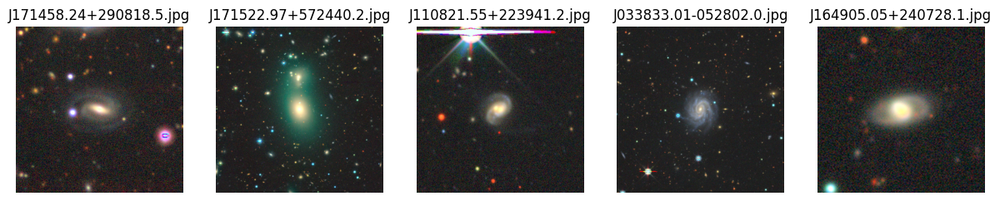

In [14]:
samples_no_dwarfs = data[data['dwarf']==0]['img_name'].sample(5).to_list()

# Mostrar las imágenes
plt.figure(figsize=(15, 10))
for i, img_name in enumerate(samples_no_dwarfs):
    img_path = os.path.join(IMAGE_DIR, img_name)
    img = Image.open(img_path)
    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')
plt.show()

A continuacion se comparan algunos histogramas de las imagenes de enanas contra no enanas.

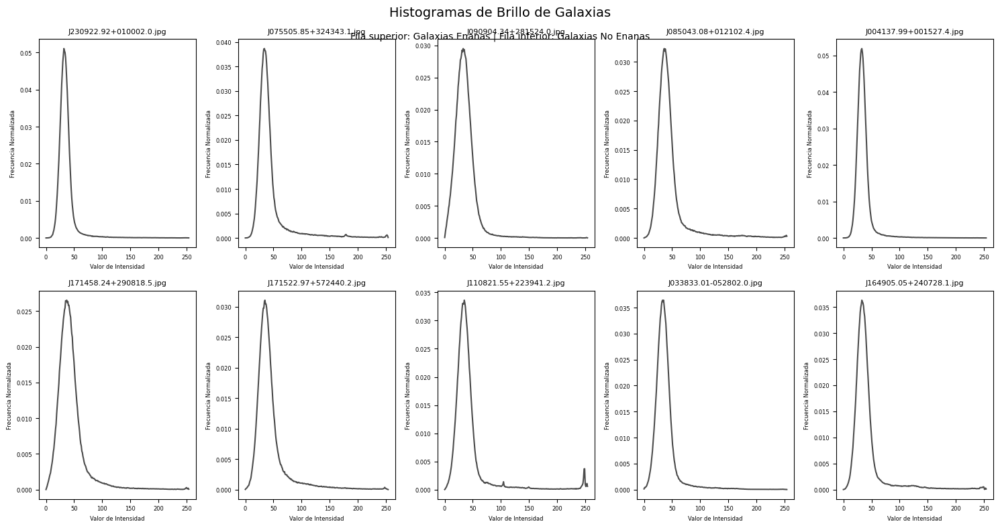

In [15]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Función para calcular histograma normalizado de una imagen
def plot_normalized_histogram(ax, image_path):
    img = Image.open(image_path).convert("L")  # Convertir a escala de grises
    img_array = np.array(img).ravel()
    
    # Calcular histograma normalizado
    hist, bins = np.histogram(img_array, bins=256, range=(0, 255), density=True)
    
    ax.plot(bins[:-1], hist, color='black', alpha=0.7)
    ax.set_title(os.path.basename(image_path), fontsize=8)
    ax.set_xlabel("Valor de Intensidad", fontsize=6)
    ax.set_ylabel("Frecuencia Normalizada", fontsize=6)
    ax.tick_params(axis='both', which='both', labelsize=6)

# Crear figura con 2 filas y 5 columnas
fig, axes = plt.subplots(2, 5, figsize=(15, 8))  
axes = axes.ravel()  # Convertir en un array 1D para facilitar iteración

# Generar histogramas para galaxias enanas (fila superior)
for i, img_name in enumerate(samples_dwarfs):
    img_path = os.path.join(IMAGE_DIR, img_name)
    plot_normalized_histogram(axes[i], img_path)

# Generar histogramas para galaxias no enanas (fila inferior)
for i, img_name in enumerate(samples_no_dwarfs):
    img_path = os.path.join(IMAGE_DIR, img_name)
    plot_normalized_histogram(axes[i + 5], img_path)  # Se colocan en la segunda fila

# Títulos generales
fig.suptitle("Histogramas de Brillo de Galaxias", fontsize=14)
plt.figtext(0.5, 0.92, "Fila superior: Galaxias Enanas | Fila inferior: Galaxias No Enanas", ha="center", fontsize=10)

# Ajustar diseño
plt.tight_layout()
plt.show()


En general se observa que los histogramas de las galaxias enanas son un mas esbeltos y ligeramente de menor valor de intensidad (hacia la izq) lo cual es de esperarse debido a que las galaxias enenas emiten menor cantidad de luz.

A continuacion se realiza un plot tipo KDE donde se agregan los histogramas de la poblacion de enanas contra una muestra similar de no enanas

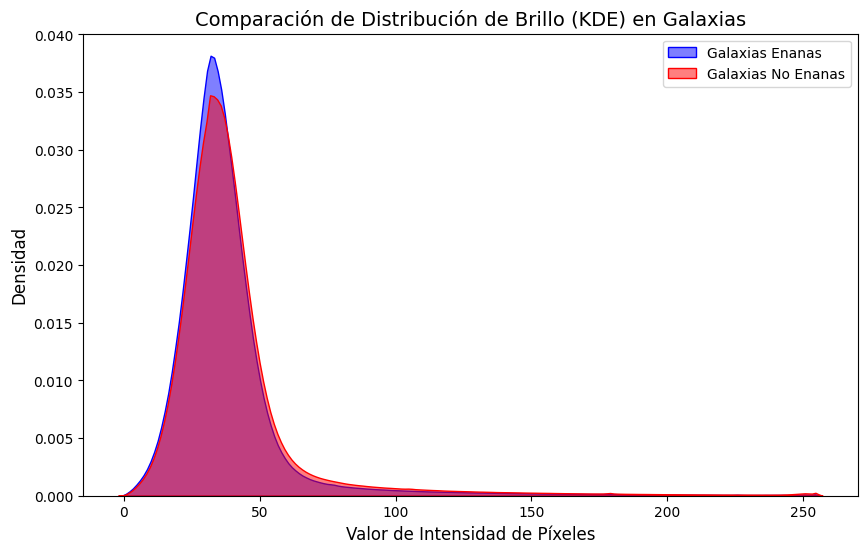

In [81]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

samples_dwarfs = data[data['dwarf']==1]['img_name'].to_list()
samples_no_dwarfs = data[data['dwarf']==0]['img_name'].sample(len(samples_dwarfs), random_state=44).to_list()


# Listas para almacenar intensidades de píxeles de cada categoría
intensities_dwarfs = []
intensities_no_dwarfs = []

# Función para extraer los valores de intensidad de una imagen
def extract_pixel_intensities(image_path):
    img = Image.open(image_path).convert("L")  # Convertir a escala de grises
    img_array = np.array(img).ravel()  # Aplanar el array de píxeles
    return img_array

# Recopilar intensidades de galaxias enanas
for img_name in samples_dwarfs:
    img_path = os.path.join(IMAGE_DIR, img_name)
    intensities_dwarfs.extend(extract_pixel_intensities(img_path))

# Recopilar intensidades de galaxias no enanas
for img_name in samples_no_dwarfs:
    img_path = os.path.join(IMAGE_DIR, img_name)
    intensities_no_dwarfs.extend(extract_pixel_intensities(img_path))

# Crear KDE plot con Seaborn
plt.figure(figsize=(10, 6))
sns.kdeplot(intensities_dwarfs, color='blue', label="Galaxias Enanas", fill=True, alpha=0.5)
sns.kdeplot(intensities_no_dwarfs, color='red', label="Galaxias No Enanas", fill=True, alpha=0.5)

# Etiquetas y título
plt.xlabel("Valor de Intensidad de Píxeles", fontsize=12)
plt.ylabel("Densidad", fontsize=12)
plt.title("Comparación de Distribución de Brillo (KDE) en Galaxias", fontsize=14)
plt.legend()
plt.show()


Se confirma que las galaxias enanas tienden a emitir menos luz que las no enanas

Verificando que se cuenta con las imagenes necesarias.

In [16]:
import os
# Comparar imágenes con la metadata
metadata_images = set(data['img_name'])
available_images = set(os.listdir(IMAGE_DIR))

# Imágenes faltantes en la metadata
missing_in_metadata = available_images - metadata_images
print(f"Imágenes no listadas en la metadata: {len(missing_in_metadata)}")

# Imágenes faltantes en el directorio
missing_in_folder = metadata_images - available_images
print(f"Imágenes listadas en la metadata pero no en el directorio: {len(missing_in_folder)}")

Imágenes no listadas en la metadata: 11253
Imágenes listadas en la metadata pero no en el directorio: 0


In [17]:
print(len(data))

10020


In [20]:
PREPROC_PATH = "..\\nair_manga\imagenes\clean"

Se verifica si las imágenes están corruptas o vacías, las preprocesa redimensionándolas y opcionalmente convirtiéndolas a escala de grises, y mejora su calidad ajustando contraste, brillo y reduciendo ruido.

In [ ]:
import os
import cv2
import numpy as np
from PIL import Image, ImageEnhance
import pandas as pd


bad_img = []

def is_corrupt_or_empty(image_path):
    try:
        img = Image.open(image_path)
        img.verify()  # Verifica si la imagen está dañada
        img = Image.open(image_path).convert("L")  # Convertir a escala de grises para analizar
        if img.getextrema() == (0, 0):  # Imagen completamente negra
            return True
    except:
        return True  # Imagen corrupta
    return False

def preprocess_image(image_path, output_path, size=(128, 128), convert_gray=False):
    img = Image.open(image_path)
    img = img.resize(size)  # Redimensionar
    if convert_gray:
        img = img.convert("L")  # Convertir a escala de grises si es necesario


    img_name = os.path.basename(image_path)
    img_name_no_ext = os.path.splitext(img_name)[0]  # Quita la extensión
    output_path = os.path.join(output_path, img_name_no_ext + ".png")

    img.save(output_path, format="PNG")  # Guardar en PNG

def enhance_image(image_path, output_path, contrast_factor=1.5, brightness_factor=1.2, denoise=True):
    # Cargar la imagen con PIL
    img = Image.open(image_path)
    mode = img.mode  # Detectar si es RGB o escala de grises

    # Ajustar contraste
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(contrast_factor)

    # Ajustar brillo
    enhancer = ImageEnhance.Brightness(img)
    img = enhancer.enhance(brightness_factor)

    # Guardar imagen temporalmente para aplicar reducción de ruido
    temp_path = "temp_enhanced.png"
    img.save(temp_path)

    # Leer la imagen con OpenCV para reducción de ruido
    img_cv = cv2.imread(temp_path)

    if mode == "L":  # Imagen en escala de grises
        img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)
        if denoise:
            img_cv = cv2.fastNlMeansDenoising(img_cv, h=10)  # Reducir ruido
    else:  # Imagen en RGB
        if denoise:
            img_cv = cv2.fastNlMeansDenoisingColored(img_cv, h=10, hForColor=10, templateWindowSize=7, searchWindowSize=21)

    # Guardar la imagen final mejorada
    cv2.imwrite(output_path, img_cv)


for _, row in data.iterrows():
    img_name = row["img_name"]
    #out_path = DWARFS_PATH if row['dwarf'] == 1.0 else NO_DWARFS_PATH
    
    img_in_path = os.path.join(IMAGE_DIR, img_name)
    #img_out_path = os.path.join(out_path, img_name)
    
    if is_corrupt_or_empty(img_in_path):
        bad_img.append(img_name)
    else:
        preprocess_image(img_in_path, PREPROC_PATH)

print(f"Preprocesamiento finalizado, imagenes corruptas: {len(bad_img)}")

Preprocesamiento finalizado, imagenes corruptas: 0


Se muestran algunas imagens de antes y despues del preporcesamiento

In [22]:
import os
import cv2
import matplotlib.pyplot as plt

def compare_images(label, n=5, random_state=48):
    original_images = data[data['dwarf']==label].sample(10, random_state=random_state)['img_name'].to_list()

    #original_images = data.sample(10, random_state=24)['img_name'].to_list()

    fig, axes = plt.subplots(n, 2, figsize=(10, 5 * n))

    for i in range(n):
        original_name = original_images[i]
        processed_name = os.path.splitext(original_name)[0] + ".png"  # Convertir extensión

        original_path = os.path.join(IMAGE_DIR, original_name)
        processed_path = os.path.join(PREPROC_PATH, processed_name)

        if not os.path.exists(processed_path):
            print(f"⚠️ No se encontró la imagen procesada para {original_name}")
            continue

        # Cargar imágenes en escala de grises
        img_original = cv2.imread(original_path)
        img_processed = cv2.imread(processed_path)

        # Mostrar imágenes
        axes[i, 0].imshow(img_original, cmap="gray")
        axes[i, 0].set_title(f"Original: {original_name}")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(img_processed, cmap="gray")
        axes[i, 1].set_title(f"Procesada: {processed_name}")
        axes[i, 1].axis("off")

    plt.tight_layout()
    plt.show()




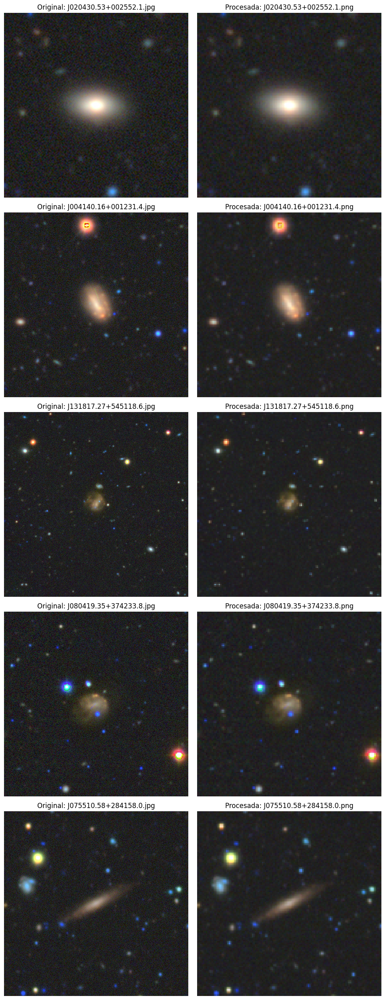

In [23]:
# Ejecutar comparación con 5 imágenes de enanas
compare_images(1.0, n=5, random_state=32)

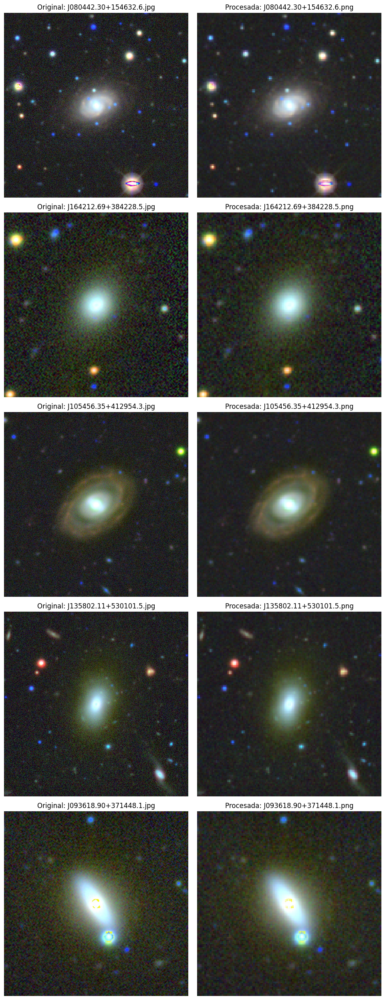

In [24]:
# Ejecutar comparación con 5 imágenes de no enanas
compare_images(0.0, n=5, random_state=2)

Se dividen las imagenes en datasets de train, test y val en folders separados

In [93]:
DATASETS_PATH = "..\\nair_manga\imagenes\datasets"
FOLDERS = {
    "train_dwarfs": os.path.join(DATASETS_PATH, "train/1_dwarfs"),
    "train_no_dwarfs": os.path.join(DATASETS_PATH, "train/0_no_dwarfs"),
    "val_dwarfs": os.path.join(DATASETS_PATH, "val/1_dwarfs"),
    "val_no_dwarfs": os.path.join(DATASETS_PATH, "val/0_no_dwarfs"),
    "test_dwarfs": os.path.join(DATASETS_PATH, "test/1_dwarfs"),
    "test_no_dwarfs": os.path.join(DATASETS_PATH, "test/0_no_dwarfs"),
}

In [ ]:
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split


# 📌 Crear carpetas si no existen
for folder in FOLDERS.values():
    os.makedirs(folder, exist_ok=True)


# 📌 Separar imágenes por clase (Dwarfs vs No Dwarfs)
original_dwarfs = data[data["dwarf"] == 1.0]
original_no_dwarfs = data[data["dwarf"] == 0.0]

# 📌 Dividir imágenes originales en train, val y test (estratificado)
train_dwarfs, temp_dwarfs = train_test_split(original_dwarfs, test_size=0.4, stratify=original_dwarfs["dwarf"], random_state=42)
val_dwarfs, test_dwarfs = train_test_split(temp_dwarfs, test_size=0.5, stratify=temp_dwarfs["dwarf"], random_state=42)

train_no_dwarfs, temp_no_dwarfs = train_test_split(original_no_dwarfs, test_size=0.4, stratify=original_no_dwarfs["dwarf"], random_state=42)
val_no_dwarfs, test_no_dwarfs = train_test_split(temp_no_dwarfs, test_size=0.5, stratify=temp_no_dwarfs["dwarf"], random_state=42)

# 📌 Mover imágenes originales a `train/`, `val/` y `test/`
def move_images(image_set, dest_folder):
    for _, row in image_set.iterrows():
        img_name = os.path.splitext(row["img_name"])[0] + ".png"
        src_path = os.path.join(PREPROC_PATH, img_name)
        dst_path = os.path.join(dest_folder, img_name)
        shutil.copy(src_path, dst_path) if os.path.exists(src_path) else None

# Mover imágenes de enanas
move_images(train_dwarfs, FOLDERS["train_dwarfs"])
move_images(val_dwarfs, FOLDERS["val_dwarfs"])
move_images(test_dwarfs, FOLDERS["test_dwarfs"])

# Mover imágenes de no enanas
move_images(train_no_dwarfs, FOLDERS["train_no_dwarfs"])
move_images(val_no_dwarfs, FOLDERS["val_no_dwarfs"])
move_images(test_no_dwarfs, FOLDERS["test_no_dwarfs"])

print("✅ Imágenes originales organizadas en train, val y test.")


✅ Imágenes originales organizadas en train, val y test.


In [95]:
import os


# 📌 Función para contar imágenes en cada subcarpeta
def count_images_in_folders(base_path):
    counts = {}
    for split in ["train", "val", "test"]:
        split_path = os.path.join(base_path, split)
        if os.path.exists(split_path):
            for class_name in os.listdir(split_path):
                class_path = os.path.join(split_path, class_name)
                if os.path.isdir(class_path):  # Asegurar que es una carpeta
                    image_count = len([f for f in os.listdir(class_path) if f.endswith(('.png', '.jpg', '.jpeg'))])
                    counts[f"{split}/{class_name}"] = image_count
    return counts

# 📌 Contar imágenes
image_counts = count_images_in_folders(DATASETS_PATH)

# 📌 Mostrar resultados
print("\n📊 Conteo de imágenes en cada carpeta:")
for folder, count in image_counts.items():
    print(f"{folder}: {count} imágenes")

# 📌 Verificar balance de clases
train_dwarfs = image_counts.get("train/1_dwarfs", 0)
train_no_dwarfs = image_counts.get("train/0_no_dwarfs", 0)
val_dwarfs = image_counts.get("val/1_dwarfs", 0)
val_no_dwarfs = image_counts.get("val/0_no_dwarfs", 0)
test_dwarfs = image_counts.get("test/1_dwarfs", 0)
test_no_dwarfs = image_counts.get("test/0_no_dwarfs", 0)

print("\n✅ Verificación de balance de clases:")
print(f"Train - Dwarfs: {train_dwarfs}, No Dwarfs: {train_no_dwarfs}")
print(f"Val - Dwarfs: {val_dwarfs}, No Dwarfs: {val_no_dwarfs}")
print(f"Test - Dwarfs: {test_dwarfs}, No Dwarfs: {test_no_dwarfs}")



📊 Conteo de imágenes en cada carpeta:
train/0_no_dwarfs: 5917 imágenes
train/1_dwarfs: 3854 imágenes
val/0_no_dwarfs: 1973 imágenes
val/1_dwarfs: 31 imágenes
test/0_no_dwarfs: 1973 imágenes
test/1_dwarfs: 32 imágenes

✅ Verificación de balance de clases:
Train - Dwarfs: 3854, No Dwarfs: 5917
Val - Dwarfs: 31, No Dwarfs: 1973
Test - Dwarfs: 32, No Dwarfs: 1973


Debido al alto desbalance de las clases se opta por generar imagenes sintéticas para el entrenamiento a partir del set de entrenamiento previamente separado realizando algunas pequeñas modificaciones aleatorias como rotacion, tamaño y ruido.

In [72]:
import os
import random
import shutil
from PIL import Image
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# 📌 Configuración de rutas
TRAIN_DWARFS_PATH = FOLDERS['train_dwarfs']
AUGMENTED_PATH = FOLDERS['train_dwarfs']

# 📌 Crear carpeta para imágenes aumentadas si no existe
os.makedirs(AUGMENTED_PATH, exist_ok=True)

# 📌 Definir transformaciones con Albumentations
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=45, p=0.5),  # Más variación en ángulos
    A.RandomBrightnessContrast(p=0.5),  # Más agresivo
    A.GaussNoise(p=0.3),
    A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50),  # Distorsión elástica
    A.GridDistortion(p=0.3),  # Distorsión geométrica
    A.HueSaturationValue(p=0.5),  # Cambios más fuertes en colores
    A.RandomResizedCrop(size=(128, 128), scale=(0.8, 1.0), ratio=(0.75, 1.33), p=0.5),
    A.MotionBlur(p=0.3),
    A.ToGray(p=0.2),
])
# 📌 Número de augmentaciones por imagen
AUG_PER_IMAGE = 40  # Puedes ajustar este valor según la cantidad deseada

# 📌 Aplicar augmentación
for img_name in os.listdir(TRAIN_DWARFS_PATH):
    img_path = os.path.join(TRAIN_DWARFS_PATH, img_name)
    
    if img_path.endswith(('.png', '.jpg', '.jpeg')):  
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for i in range(AUG_PER_IMAGE):
            augmented = transform(image=image)["image"]
            augmented_img_name = f"{os.path.splitext(img_name)[0]}_aug{i}.png"
            augmented_img_path = os.path.join(AUGMENTED_PATH, augmented_img_name)

            cv2.imwrite(augmented_img_path, cv2.cvtColor(augmented, cv2.COLOR_RGB2BGR))

print(f"✅ Augmentación completada. Imágenes guardadas en '{AUGMENTED_PATH}'.")


C:\Users\AMD RYZEN 7\AppData\Local\Temp\ipykernel_33096\3920758445.py:22: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50),  # Distorsión elástica


✅ Augmentación completada. Imágenes guardadas en '..\nair_manga\imagenes\datasets\train/dwarfs'.


Ejemplo de imagen original y sus imagenes aumentadas

C:\Users\AMD RYZEN 7\AppData\Local\Temp\ipykernel_33096\329764756.py:25: UserWarning: Argument 'alpha_affine' is not valid and will be ignored.
  A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50),  # Distorsión elástica


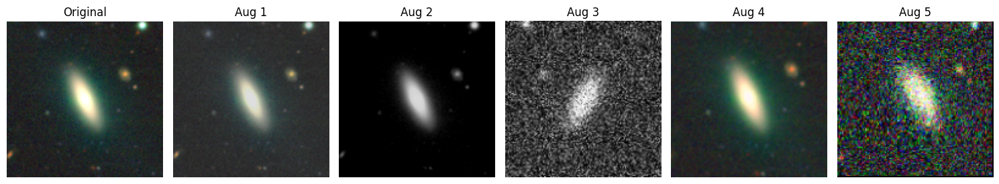

In [177]:
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import random

# 📌 Ruta de las imágenes (ajusta según tu dataset)
data_dir = FOLDERS['train_no_dwarfs']

# 📌 Seleccionar una imagen aleatoria
img_name = random.choice(os.listdir(data_dir))
img_path = os.path.join(data_dir, img_name)

# 📌 Cargar imagen original
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB (OpenCV usa BGR por defecto)

# 📌 Definir transformaciones de augmentación con Albumentations
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=45, p=0.5),  # Más variación en ángulos
    A.RandomBrightnessContrast(p=0.5),  # Más agresivo
    A.GaussNoise(p=0.3),
    A.ElasticTransform(p=0.3, alpha=1, sigma=50, alpha_affine=50),  # Distorsión elástica
    A.GridDistortion(p=0.3),  # Distorsión geométrica
    A.HueSaturationValue(p=0.5),  # Cambios más fuertes en colores
    A.RandomResizedCrop(size=(128, 128), scale=(0.8, 1.0), ratio=(0.75, 1.33), p=0.5),
    A.MotionBlur(p=0.3),
    A.ToGray(p=0.2),
])

# 📌 Aplicar augmentaciones
augmented_images = [transform(image=image)["image"] for _ in range(5)]  # Generar 5 augmentaciones

# 📌 Graficar imagen original y augmentadas
fig, axes = plt.subplots(1, 6, figsize=(15, 5))

# 📌 Mostrar imagen original
axes[0].imshow(image)
axes[0].set_title("Original")
axes[0].axis("off")

# 📌 Mostrar imágenes aumentadas
for i, aug_img in enumerate(augmented_images):
    axes[i+1].imshow(aug_img)
    axes[i+1].set_title(f"Aug {i+1}")
    axes[i+1].axis("off")

plt.tight_layout()
plt.show()


## Modelo base

**Selección del Modelo**

Para la clasificación se utilizó ConvNeXt-Tiny, una red convolucional moderna optimizada para tareas de clasificación de imágenes. Se eligió esta arquitectura por su alto rendimiento en datasets de visión por computadora y su capacidad para ser ajustada mediante Fine-Tuning.

Consideraciones en la selección del modelo:
- Uso de un modelo preentrenado para aprovechar características previamente aprendidas.
- Congelación de capas iniciales para preservar el conocimiento del modelo base y evitar el sobreajuste.
- Ajuste de las últimas capas para mejorar la clasificación en el dataset específico.
- Incorporación de técnicas de regularización, como Dropout, para mejorar la generalización.

---

**Preprocesamiento de Datos**

El dataset se estructuró en tres conjuntos: entrenamiento, validación y prueba, asegurando una distribución representativa de ambas clases. Para mejorar la robustez del modelo, se aplicaron varias transformaciones a las imágenes.

Técnicas de preprocesamiento utilizadas:
- Redimensionado de imágenes a un tamaño uniforme para optimizar la eficiencia del modelo.
- Normalización de valores de píxeles para mejorar la estabilidad del entrenamiento.
- Conversión opcional a escala de grises, evaluando si la información de color era relevante para la clasificación.

Estas técnicas permitieron mejorar la consistencia de los datos y evitar sesgos durante el entrenamiento.

---

**Manejo del Desbalance de Clases**

Uno de los principales desafíos en el proyecto fue el fuerte desbalance de clases, con muchas más imágenes de galaxias no enanas en comparación con las enanas. Para abordar este problema, se implementaron varias estrategias:

Métodos aplicados:
- Aumento de datos en la clase minoritaria mediante técnicas de transformación de imágenes.
- Ajuste de la función de pérdida para penalizar más los errores en la detección de la clase menos representada.
- Uso de pesos en el entrenamiento, asegurando que ambas clases tengan un impacto equilibrado en la optimización del modelo.

Estas estrategias ayudaron a reducir el sesgo del modelo y mejorar su capacidad para identificar galaxias enanas.

---

**Entrenamiento y Optimización**

El entrenamiento del modelo se llevó a cabo mediante un enfoque progresivo, ajustando hiperparámetros clave para mejorar el rendimiento.

Estrategias de entrenamiento:
- Uso de Fine-Tuning, desbloqueando capas específicas del modelo preentrenado para permitir ajustes en la representación de características.
- Ajuste dinámico del Learning Rate, reduciendo la tasa de aprendizaje cuando la mejora en validación se estancaba.
- Implementación de Early Stopping, deteniendo el entrenamiento si el modelo dejaba de mejorar, evitando el sobreajuste.

El modelo se evaluó en múltiples iteraciones, comparando diferentes configuraciones y ajustando parámetros hasta encontrar un balance óptimo entre precisión y generalización.

---

**Evaluación del Modelo**

Para medir el rendimiento del modelo, se utilizaron métricas de evaluación estándar, incluyendo la precisión en el conjunto de prueba, la matriz de confusión y el análisis de errores.

---

In [166]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, datasets, transforms
from torch.utils.data import DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
import os

# 📌 Configuración inicial
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Usando dispositivo: {device}")

# 📌 Hiperparámetros básicos
img_size = 128
batch_size = 16
learning_rate = 3e-4  # Aumento el LR para empezar con algo básico
num_epochs = 10  # Mantenerlo bajo inicialmente

# 📌 Transformaciones (sin cambios)
data_transforms = transforms.Compose([
    #transforms.Grayscale(num_output_channels=3),
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# 📌 Cargar dataset con ImageFolder
data_dir = DATASETS_PATH
train_dir = os.path.join(data_dir, "train")
val_dir = os.path.join(data_dir, "val")
test_dir = os.path.join(data_dir, "test")

train_dataset = datasets.ImageFolder(root=train_dir, transform=data_transforms)
val_dataset = datasets.ImageFolder(root=val_dir, transform=data_transforms)
test_dataset = datasets.ImageFolder(root=test_dir, transform=data_transforms)

# 📌 Cargar DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# 📌 Cargar ConvNeXt-Tiny preentrenado (congelando todas las capas salvo la última)
from torchvision.models import ConvNeXt_Tiny_Weights
model = models.convnext_tiny(weights=ConvNeXt_Tiny_Weights.DEFAULT)

# 🔹 Congelar TODAS las capas del modelo salvo la última
for param in model.parameters():
    param.requires_grad = False

# 📌 Modificar la última capa para clasificación binaria
num_ftrs = model.classifier[2].in_features
#model.classifier[2] = nn.Linear(num_ftrs, 1)  # ❌ NO agregar Sigmoid aquí (se maneja con BCEWithLogitsLoss)
model.classifier = nn.Sequential(
    nn.Flatten(),
    nn.Linear(num_ftrs, 256),
    nn.ReLU(),
    nn.Dropout(0.6),  # 🔥 Aumentamos Dropout para evitar sobreajuste
    nn.Linear(256, 128),
    nn.ReLU(),
    nn.Dropout(0.6),  # 🔥 Otro Dropout para mayor regularización
    nn.Linear(128, 1)  # Capa de salida
)


for layer in model.classifier:
    if isinstance(layer, nn.Linear):  # 🔥 Evitamos Dropout y ReLU
        nn.init.xavier_uniform_(layer.weight)
        layer.bias.data.fill_(0)

# 🔹 Descongelamos las últimas 20 capas para permitir Fine-Tuning
for param in model.features[-20:].parameters():
    param.requires_grad = True  # Permitir ajuste de estas capas

model = model.to(device)

# 📌 Usar la pérdida más simple (BCEWithLogitsLoss)
# 📌 Calcular pesos para balancear la clase minoritaria
num_no_dwarfs = 5917  # Actualiza con el número real
num_dwarfs = 3854  # Actualiza con el número real
class_counts = [num_no_dwarfs, num_dwarfs]
class_weights = torch.tensor([class_counts[1] / sum(class_counts), class_counts[0] / sum(class_counts)]).to(device)

# 📌 Definir la pérdida con ajuste de pesos
criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor(8.0).to(device))

# 📌 Optimizador simple (Adam con LR más alto)
optimizer = optim.Adam(model.classifier.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5, min_lr=1e-6)

#early_stopping = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5, min_lr=1e-6, verbose=True)

# 📌 Entrenamiento del modelo
def train_model(model, criterion, optimizer, train_loader, val_loader, epochs=15, patience=5):
    best_val_loss = float('inf')
    patience_counter = 0  # Contador para early stopping

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images, labels = images.to(device), labels.float().to(device).view(-1, 1)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
            preds = (torch.sigmoid(outputs) > 0.4).float()
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_acc = correct / total
        train_loss = running_loss / len(train_loader)

        # 📌 Evaluación en validación
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.float().to(device).view(-1, 1)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item()

                preds = (torch.sigmoid(outputs) > 0.4).float()
                val_correct += (preds == labels).sum().item()
                val_total += labels.size(0)

        val_acc = val_correct / val_total
        val_loss = val_loss / len(val_loader)

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # 📌 Llamar a `ReduceLROnPlateau` para ajustar el LR si no mejora
        scheduler.step(val_loss)
        print(f"Nuevo Learning Rate: {optimizer.param_groups[0]['lr']:.6f}")

        # 📌 Early Stopping: Si la pérdida de validación no mejora en `patience` épocas, detener entrenamiento
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0  # Resetear paciencia
            best_model = model.state_dict()  # Guardar mejor modelo
        else:
            patience_counter += 1  # Incrementar paciencia

        if patience_counter >= patience:
            print(f"⏹️ Early stopping activado en la época {epoch+1}")
            break  # Salir del bucle de entrenamiento

    # 📌 Cargar el mejor modelo antes del stopping
    model.load_state_dict(best_model)
    return model

# 📌 Entrenar el modelo con lo más simple
model = train_model(model, criterion, optimizer, train_loader, val_loader, epochs=num_epochs)


✅ Usando dispositivo: cuda
Epoch 1/10, Train Loss: 0.8333, Train Acc: 0.6902, Val Loss: 0.4303, Val Acc: 0.8583
Nuevo Learning Rate: 0.000300
Epoch 2/10, Train Loss: 0.5250, Train Acc: 0.8353, Val Loss: 0.3704, Val Acc: 0.9087
Nuevo Learning Rate: 0.000300
Epoch 3/10, Train Loss: 0.4733, Train Acc: 0.8596, Val Loss: 0.3481, Val Acc: 0.9182
Nuevo Learning Rate: 0.000300
Epoch 4/10, Train Loss: 0.4592, Train Acc: 0.8691, Val Loss: 0.3705, Val Acc: 0.8663
Nuevo Learning Rate: 0.000300
Epoch 5/10, Train Loss: 0.4208, Train Acc: 0.8813, Val Loss: 0.4082, Val Acc: 0.8234
Nuevo Learning Rate: 0.000300
Epoch 6/10, Train Loss: 0.4214, Train Acc: 0.8774, Val Loss: 0.3219, Val Acc: 0.9122
Nuevo Learning Rate: 0.000300
Epoch 7/10, Train Loss: 0.4054, Train Acc: 0.8850, Val Loss: 0.3637, Val Acc: 0.8533
Nuevo Learning Rate: 0.000300
Epoch 8/10, Train Loss: 0.3916, Train Acc: 0.8863, Val Loss: 0.4230, Val Acc: 0.7989
Nuevo Learning Rate: 0.000300
Epoch 9/10, Train Loss: 0.3613, Train Acc: 0.8946, Va

Test Accuracy: 0.8923
[[1771  202]
 [  14   18]]


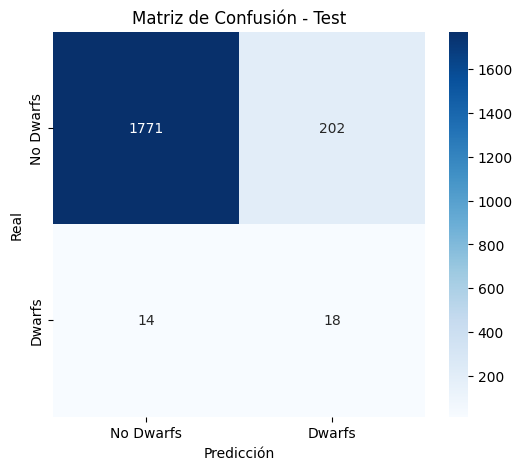

In [175]:
from sklearn.metrics import confusion_matrix


def evaluate_model(model, test_loader):
    model.eval()
    test_correct, test_total = 0, 0
    y_true, y_pred = [], []
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.float().to(device).view(-1, 1)
            outputs = model(images)

            # 🔥 Ajustamos el umbral de clasificación
            preds = (torch.sigmoid(outputs) > 0.35).float()

            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())
            test_correct += (preds == labels).sum().item()
            test_total += labels.size(0)

    test_acc = test_correct / test_total
    print(f"Test Accuracy: {test_acc:.4f}")

    # 📌 Matriz de Confusión
    cm = confusion_matrix(y_true, y_pred)
    print(cm)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Dwarfs", "Dwarfs"], yticklabels=["No Dwarfs", "Dwarfs"])
    plt.xlabel("Predicción")
    plt.ylabel("Real")
    plt.title("Matriz de Confusión - Test")
    plt.show()



# 📌 Evaluar en Test después de entrenamiento
evaluate_model(model, test_loader)


## Conclusión

El modelo desarrollado para la clasificación de galaxias enanas y no enanas logró un desempeño competitivo, a pesar del fuerte desbalance de clases. Se implementaron múltiples estrategias para mejorar la detección de la clase minoritaria, incluyendo Fine-Tuning de un modelo preentrenado (ConvNeXt-Tiny), ajuste de la función de pérdida, aumento de datos y técnicas de regularización.

### Resultados Finales
A partir de la última matriz de confusión obtenida:

[[1771 202] → 1771 "No Dwarfs" correctos, pero 202 mal clasificados como "Dwarfs"
[ 14 18]] → 18 "Dwarfs" correctamente detectadas, pero 14 fueron clasificadas como "No Dwarfs"


Se calcularon las siguientes métricas:

- Precisión global (Accuracy): 89.23%
- Precisión (Precision) para Dwarfs: 8.11%
- Recall (Sensibilidad) para Dwarfs: 56.25%
- F1-Score para Dwarfs: 14.15%

El modelo tiene una alta precisión general (89.23%), pero la detección de Dwarfs sigue siendo un reto, con una baja precisión (8.11%) pero un recall más alto (56.25%), indicando que, aunque detecta pocas enanas, las que clasifica como tales son mayormente correctas.

### Consideraciones Finales
- El modelo logra detectar galaxias enanas, pero aún tiende a clasificarlas como No Dwarfs, lo que afecta la precisión.
- El desbalance de clases sigue siendo un factor crítico, aunque las estrategias de pesos en la función de pérdida y generación de imágenes sintéticas ayudaron a mitigar su impacto.
- El Fine-Tuning de las últimas capas de ConvNeXt-Tiny permitió mejorar el desempeño sin aumentar demasiado el tiempo de entrenamiento.
- La regularización con Dropout fue clave para evitar sobreajuste y mejorar la generalización.

### Posibles Mejoras Futuras
- Explorar arquitecturas más robustas, como modelos especializados en clasificación de imágenes astronómicas.
- Optimizar el umbral de decisión para mejorar la detección de Dwarfs sin aumentar demasiado los falsos positivos.
- Ajustar aún más los pesos en la función de pérdida para mejorar la precisión en la clase minoritaria.
- Ampliar el dataset con más imágenes reales y sintéticas para mejorar la representatividad de las galaxias enanas.

En general, este trabajo representa un avance significativo en la clasificación de galaxias enanas y no enanas mediante aprendizaje profundo, con un modelo que ha sido optimizado para enfrentar el desafío del desbalance de clases.

END